In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/imagee/download.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images.csv
/kaggle/input/fashion-product-images-dataset/fashion-dataset/styles.csv
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/31973.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/30778.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/19812.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/22735.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/38246.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/16916.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/52876.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/39500.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/44758.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/59454.jpg
/kaggle/input/fashion-product-images-datas

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import GlobalMaxPooling2D
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input
import numpy as np
from numpy.linalg import norm
import os
import pickle

2024-07-15 14:32:28.199139: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-15 14:32:28.199244: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-15 14:32:28.375251: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Using Transfer Learning

In [3]:
model=ResNet50(weights='imagenet',include_top=False,input_shape=(224,224,3))
model.trainable=False

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [4]:
model=tf.keras.Sequential([
    model,
    GlobalMaxPooling2D()
])

In [5]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ ?                      │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d            │ ?                      │   0 (unbuilt) │
│ (GlobalMaxPooling2D)            │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

Extracting Features

In [6]:
def extract_features(img_path,model):
    img=image.load_img(img_path,target_size=(224,224))
    img_array=image.img_to_array(img)
    expand_img_array=np.expand_dims(img_array,axis=0)
    preprocessed_img=preprocess_input(expand_img_array)
    result=model.predict(preprocessed_img).flatten()
    normalized_result=result/norm(result)
    
    return normalized_result

In [7]:
filenames=[]
for file in os.listdir('/kaggle/input/fashion-product-images-dataset/fashion-dataset/images'):
    filenames.append(os.path.join('/kaggle/input/fashion-product-images-dataset/fashion-dataset/images',file))
    
   

In [8]:
len(filenames)

44441

In [9]:
feature_list=[]
for file in filenames:
    feature_list.append(extract_features(file,model))
    

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


I0000 00:00:1721054018.683952     116 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

In [10]:
np.array(feature_list).shape

(44441, 2048)

In [11]:
pickle.dump(feature_list,open('embeddings.pkl','wb'))
pickle.dump(filenames,open('filenames.pkl','wb'))

Testing

In [12]:
import pickle
import numpy as np
from tensorflow.keras.preprocessing import image
feature_list=np.array(pickle.load(open('embeddings.pkl','rb')))
filenames=pickle.load(open('filenames.pkl','rb'))

In [16]:
img=image.load_img('/kaggle/input/imagee/download.jpg',target_size=(224,224))
img_array=image.img_to_array(img)
expand_img_array=np.expand_dims(img_array,axis=0)
preprocessed_img=preprocess_input(expand_img_array)
result=model.predict(preprocessed_img).flatten()
normalized_result=result/norm(result)
print(normalized_result)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
[0.         0.02587428 0.         ... 0.01163998 0.0178861  0.02313872]


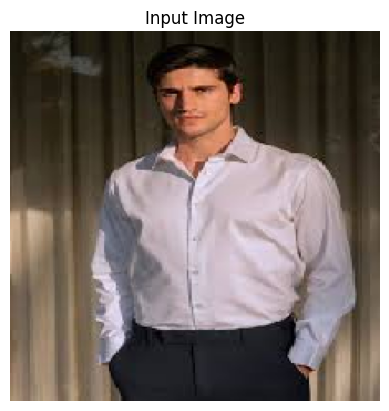

In [26]:
plt.imshow(img)
plt.title('Input Image')
plt.axis('off')  # Hide axes
plt.show()


In [18]:
from sklearn.neighbors import NearestNeighbors
neighbors = NearestNeighbors(n_neighbors=6,algorithm='brute',metric='euclidean')
neighbors.fit(feature_list)

distances,indices = neighbors.kneighbors([normalized_result])

print(indices)

[[ 9267   470 26493  1169  3977 39050]]


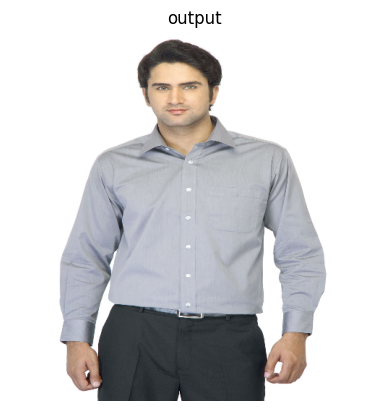

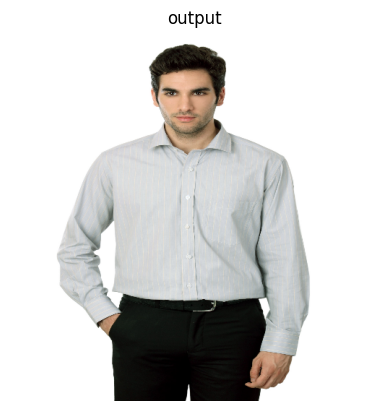

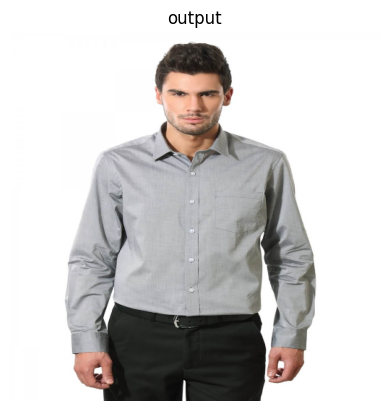

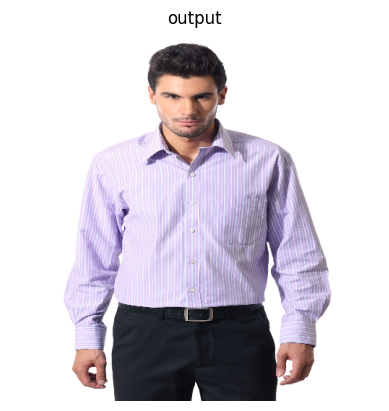

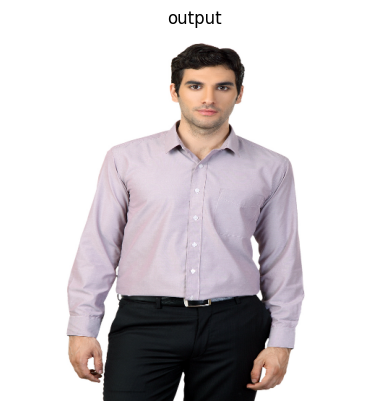

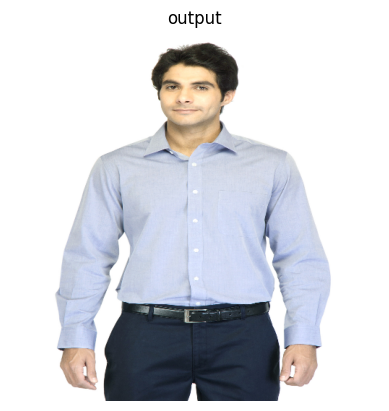

In [25]:
import cv2
import matplotlib.pyplot as plt

for file in indices[0]:
    temp_img = cv2.imread(filenames[file])
    temp_img = cv2.resize(temp_img, (512, 512))
    
    # Convert BGR image to RGB
    temp_img = cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB)
    
    plt.imshow(temp_img)
    plt.title('output')
    plt.axis('off')  # Hide axes
    plt.show()
